In [1]:
import os
import json
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
from utils import *
import scipy.stats as stats

# Sanity Checks

Image shape (wxh) (500, 333)
Image np shape (333, 500, 3)
X_prime shape (6,)
Segments shape (333, 500)
(5, 6) Samples shape
(5, 333, 500, 3) Sample images shape
Displaying samples [[0 1 0 0 0 0]
 [0 0 0 0 1 0]
 [0 0 0 0 1 1]
 [1 0 0 0 0 1]
 [0 0 0 1 0 0]]


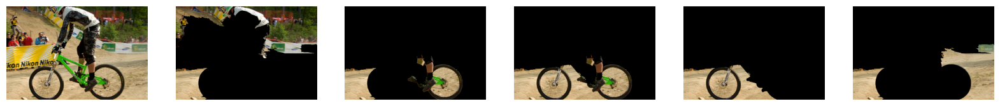

In [8]:
img_path = 'imagenet_samples/mountain_bike.JPEG'
img = Image.open(img_path).convert('RGB')
img_np = np.array(img)
print("Image shape (wxh)", img.size)
print("Image np shape", img_np.shape)

x_prime, segments = get_interpretable_image(image=img, compactness=20)
print("X_prime shape", x_prime.shape)
print("Segments shape", segments.shape)

samples = generate_samples(x_prime, segments, num_samples=5, prob_feature=0.25)
print(samples.shape, "Samples shape")

sample_images = generate_sample_images(image=img, segments=segments, x_prime=x_prime, samples=samples)
print(sample_images.shape, "Sample images shape")

#display samples images in a grid alongside the original image
print("Displaying samples", samples)
display_samples(sample_images, img)



# Explanations

## Setup Model and Inference

In [2]:
# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.eval()  # Set model to evaluation mode

# Define the image preprocessing transformations
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]   
    )
])

preprocess_size = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])

c:\Users\ved67\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ved67\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
# Load the ImageNet class index mapping
with open("imagenet_class_index.json") as f:
    class_idx = json.load(f)
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label = {v[0]: v[1] for v in class_idx.values()}

imagenet_path = 'imagenet_samples'

# List of image file paths
image_paths = [f"{imagenet_path}/{file_path}" for file_path in os.listdir(imagenet_path)]

In [4]:
def inference(model, input_image, return_grad=False):
    if isinstance(input_image, Image.Image):
        input_tensor = preprocess(input_image)
    else:
        input_tensor = input_image
    input_batch = input_tensor.unsqueeze(0)
    if return_grad:
        input_batch.requires_grad_(True)
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')
        output = model(input_batch)
        _, predicted_idx = torch.max(output, 1)
        predicted_idx = predicted_idx.item()
        predicted_synset = idx2synset[predicted_idx]
        predicted_label = idx2label[predicted_idx]
        
        if return_grad:
            if input_batch.grad is not None:
                input_batch.grad.data.zero_()
            input_batch.retain_grad()
            output[0, predicted_idx].backward()
            if input_batch.grad is None:
                raise ValueError("Input gradient is None")
            return predicted_idx, predicted_synset, predicted_label, input_batch.grad.clone()
        
        return predicted_idx, predicted_synset, predicted_label

def batch_inference(model, input_images, return_grad=False):
    if isinstance(input_images[0], Image.Image):
        input_tensors = torch.stack([preprocess(img) for img in input_images])
        input_batch = input_tensors
    else:
        input_batch = input_images
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')
    if return_grad:
        input_batch.requires_grad_(True)
    output = model(input_batch)
    _, predicted_idx = torch.max(output, 1)
    predicted_idx = predicted_idx.cpu().numpy()
    predicted_synsets = [idx2synset[idx] for idx in predicted_idx]
    predicted_labels = [idx2label[idx] for idx in predicted_idx]
    
    if return_grad:
        if input_batch.grad is not None:
            input_batch.grad.data.zero_()
        input_batch.retain_grad()
        output[range(len(predicted_idx)), predicted_idx].sum().backward()
        if input_batch.grad is None:
                raise ValueError("Input gradient is None")
        return predicted_idx, predicted_synsets, predicted_labels, input_batch.grad.clone()
    return predicted_idx, predicted_synsets, predicted_labels

In [5]:
for img_path in image_paths:
    input_image = Image.open(img_path).convert('RGB')
    predicted_idx, predicted_synset, predicted_label = inference(model, input_image)
    print(f"Predicted label: {predicted_synset} ({predicted_label})", "target file name: ", img_path.split('/')[-1])
    #print("class index: ", predicted_idx)
    print()

Predicted label: n03792782 (mountain_bike) target file name:  mountain_bike.JPEG

Predicted label: n03250847 (drumstick) target file name:  mousetrap.JPEG

Predicted label: n04118776 (rule) target file name:  paintbrush.JPEG

Predicted label: n01806143 (peacock) target file name:  peacock.JPEG

Predicted label: n03938244 (pillow) target file name:  piggy_bank.JPEG



## LIME

In [6]:
from sklearn.linear_model import Lasso
def lime(image, image_interp, segments, sim_kernel, explain_len, model, num_sampels=100, batch_size=10):
    features = []
    while len(features) < num_sampels:
        samples = generate_samples(image_interp, segments, num_samples=min(batch_size, num_sampels-len(features)), prob_feature=0.25)
        sample_images_np = generate_sample_images(image=image, segments=segments, x_prime=image_interp, samples=samples)
        sample_images = [Image.fromarray(sample_image) for sample_image in sample_images_np]
        predicted_idx, predicted_synsets, predicted_labels = batch_inference(model, sample_images)
        samples_sim = [sim_kernel(image_sample, np.array(image), sigma=0.5) for image_sample in sample_images_np]
        features += list(zip(samples, samples_sim, predicted_idx))
    
    X = np.array([f[0] for f in features])
    y = np.array([f[2] for f in features])
    weights = np.array([f[1] for f in features])
    lasso = Lasso(alpha=0.001, max_iter=5000, positive=True, tol=1e-5)
    lasso.fit(X, y, sample_weight=weights)
    
    feature_weights = {}
    num_segments = len(np.unique(segments))
    for i in range(num_segments):
        feature_weights[i] = abs(lasso.coef_[i])
    sorted_features = sorted(feature_weights.items(), key=lambda x: x[1], reverse=True)
    feature_weights = dict(sorted_features[:explain_len])
    
    importance_mask = np.zeros_like(segments, dtype=float)
    max_weight = max(feature_weights.values()) if feature_weights else 1
    for segment_idx, weight in feature_weights.items():
        importance_mask[segments == segment_idx] = weight / max_weight
    
    return importance_mask
        

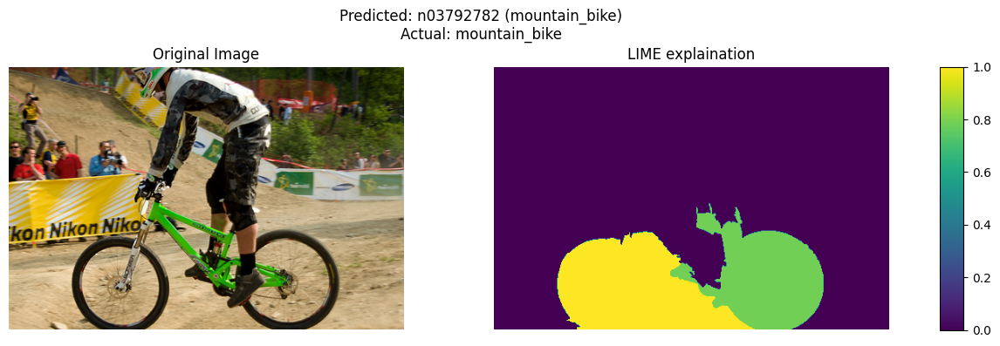

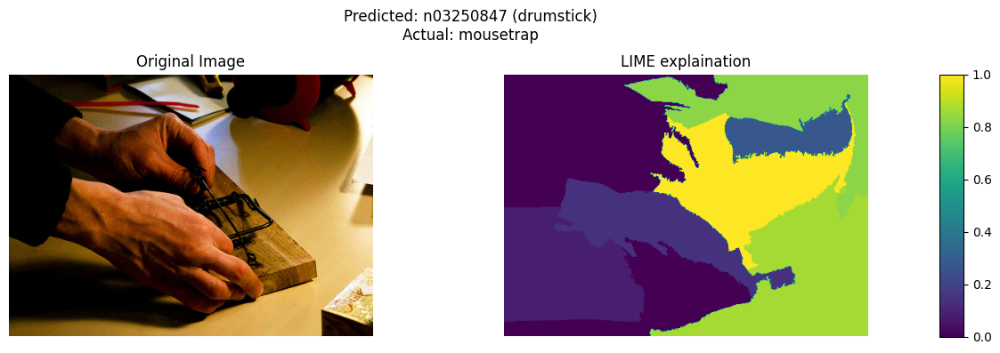

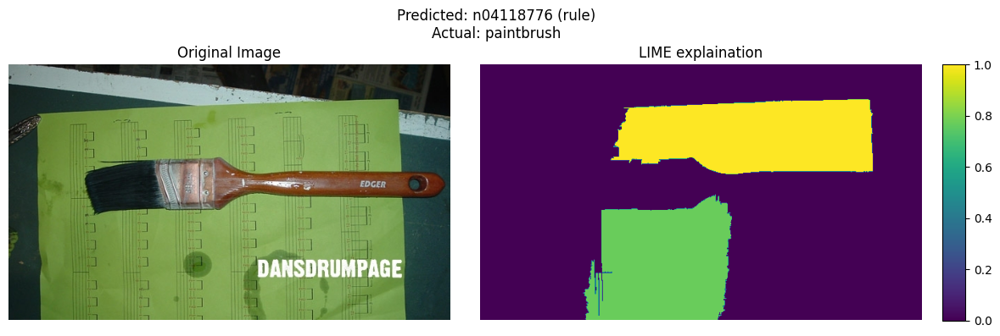

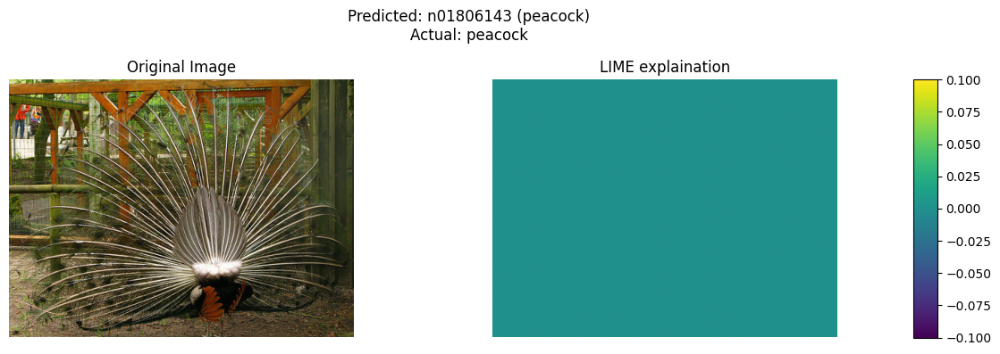

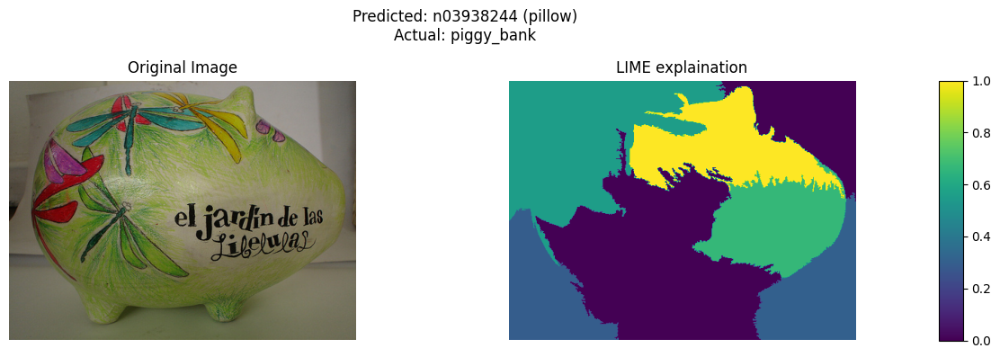

In [7]:
for img_path in image_paths:
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    x_prime, segments = get_interpretable_image(image=img, compactness=20)
    predicted_idx, predicted_synset, predicted_label = inference(model, img)
    importance_mask = lime(img, x_prime, segments, sim_kernel=image_similarity_kernel, explain_len=15, model=model, num_sampels=300)
    
    visualize_explanations(img_np, [importance_mask], ['LIME explaination'], suptitle=f"Predicted: {predicted_synset} ({predicted_label})\nActual: {img_path.split('/')[-1].split('.')[0].strip()}")

## SmoothGrad

In [8]:
def smooth_grad(img, noise_level, num_samples=100, batch_size=10):
    base_tensor = preprocess(img)
    tensor_shape = base_tensor.shape
    grad = np.zeros(tensor_shape)
    samples_done = 0
    while samples_done < num_samples:
        sample_images = []
        batch_tensors = []
        curr_batch_size = min(batch_size, num_samples-samples_done)
        for _ in range(curr_batch_size):
            noise = torch.randn_like(base_tensor) * noise_level
            noisy_tensor = base_tensor + noise
            batch_tensors.append(noisy_tensor)
        batch_tensor = torch.stack(batch_tensors)
        predicted_idx, predicted_synset, predicted_label, img_grad = batch_inference(model, batch_tensor, return_grad=True)
        img_grad = np.abs(img_grad.cpu().numpy())
        grad += np.sum(img_grad, axis=0)
        samples_done += len(batch_tensor)
    grad /= num_samples
    #normalize grad
    grad = (grad - grad.min()) / (grad.max() - grad.min())
    return grad

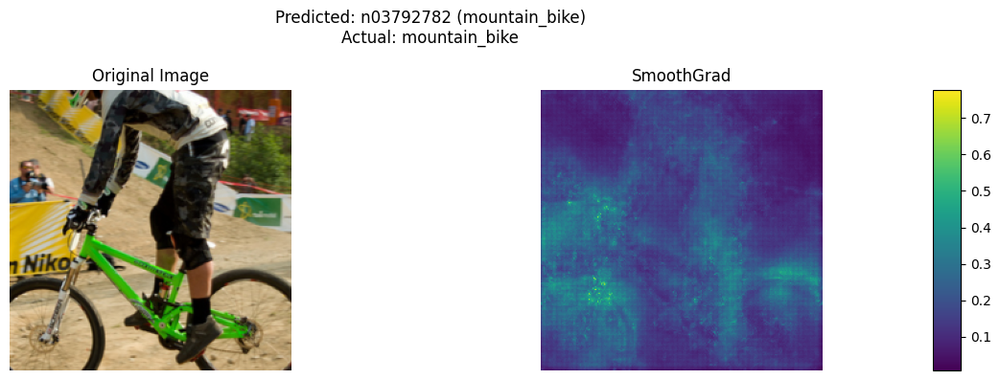

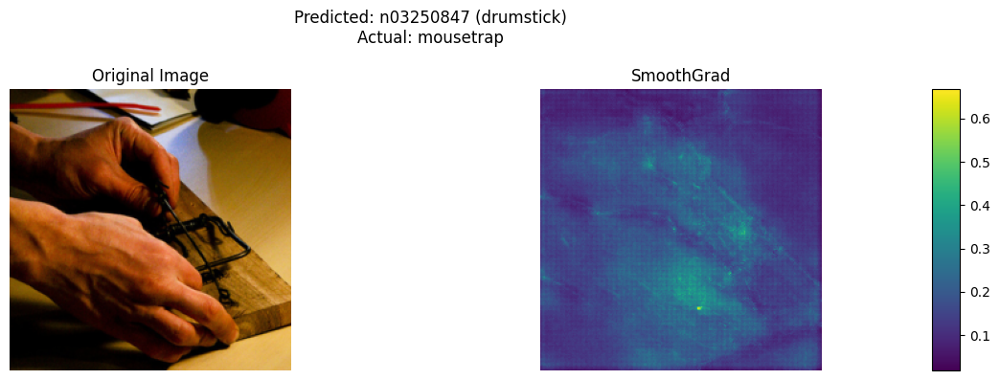

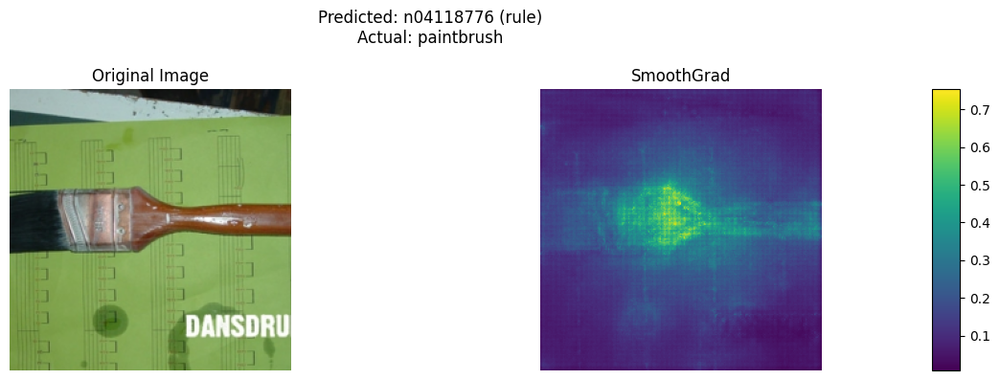

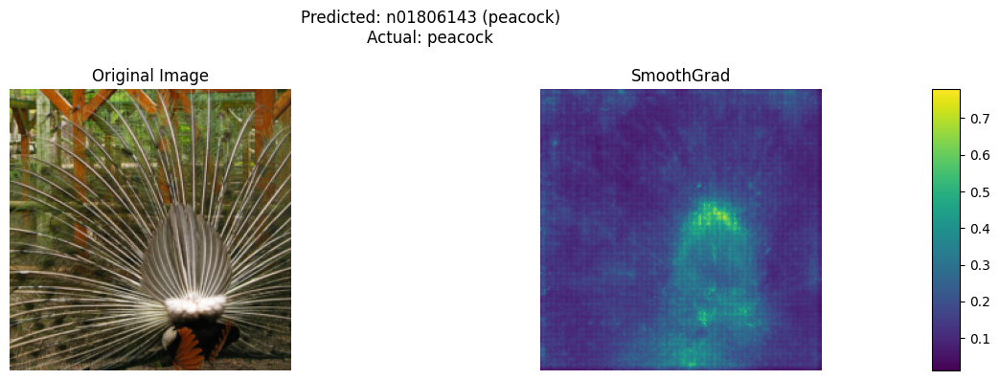

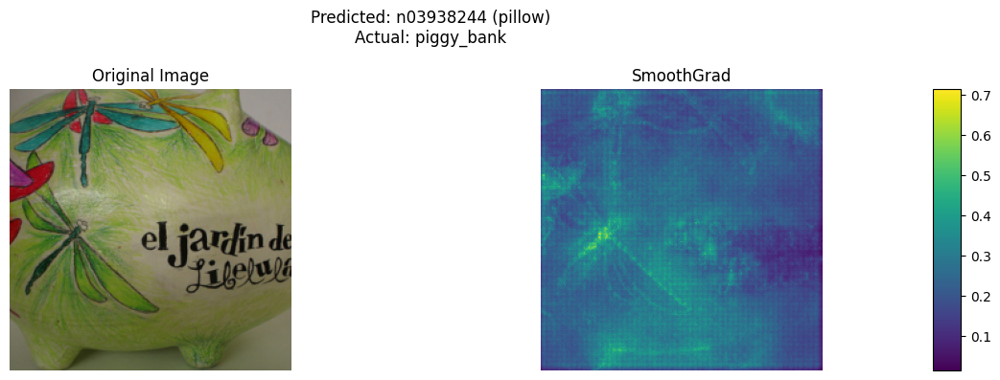

In [9]:
for img_path in image_paths:
    img = Image.open(img_path).convert('RGB')
    img_grad = smooth_grad(img, noise_level=0.5, num_samples=200)
    img_np = np.array(preprocess_size(img))
    channel_axis = 0 if img_grad.shape[0] == 3 else 2
    img_grad = np.mean(img_grad, axis=channel_axis)
    predicted_idx, predicted_synset, predicted_label = inference(model, img)
    visualize_explanations(img_np, [img_grad], ['SmoothGrad'], suptitle=f"Predicted: {predicted_synset} ({predicted_label})\nActual: {img_path.split('/')[-1].split('.')[0].strip()}")

## Explainations Comparisons

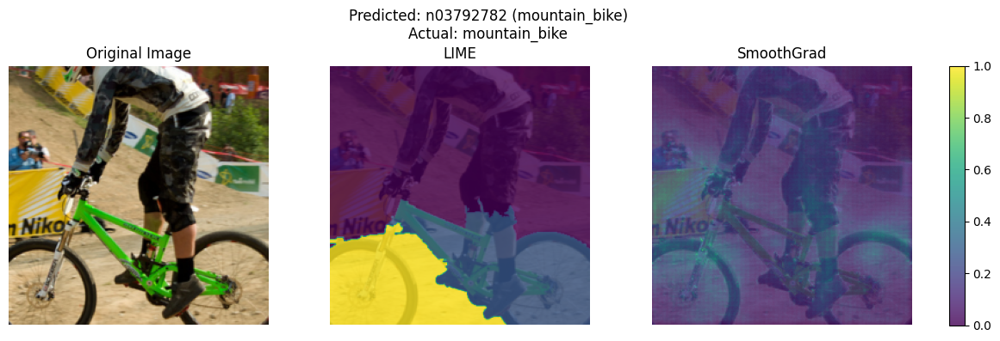

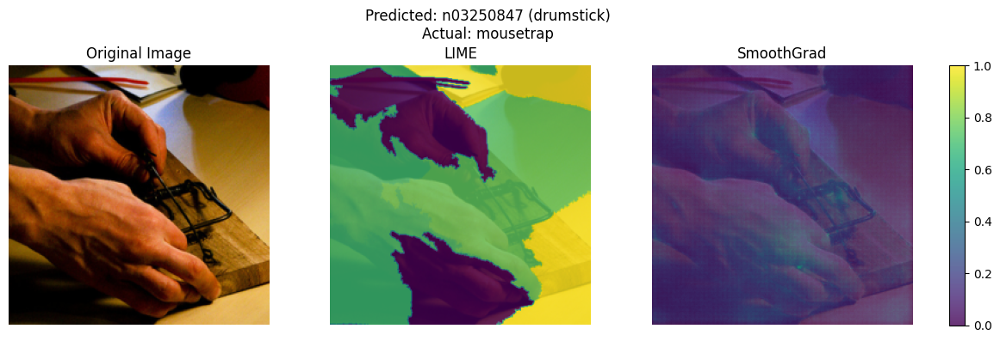

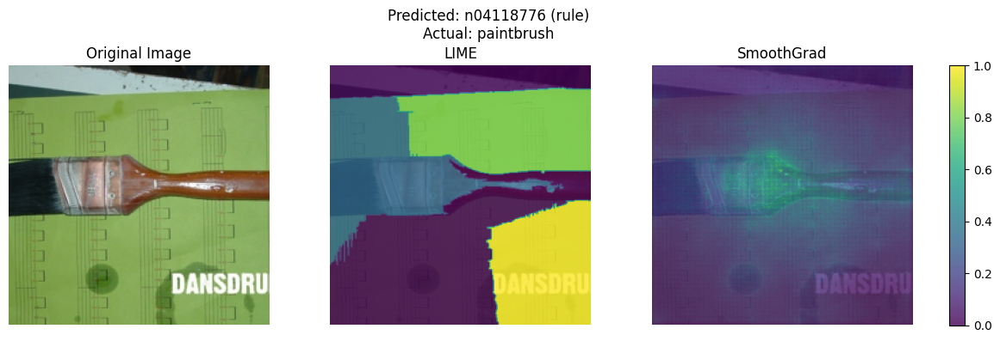

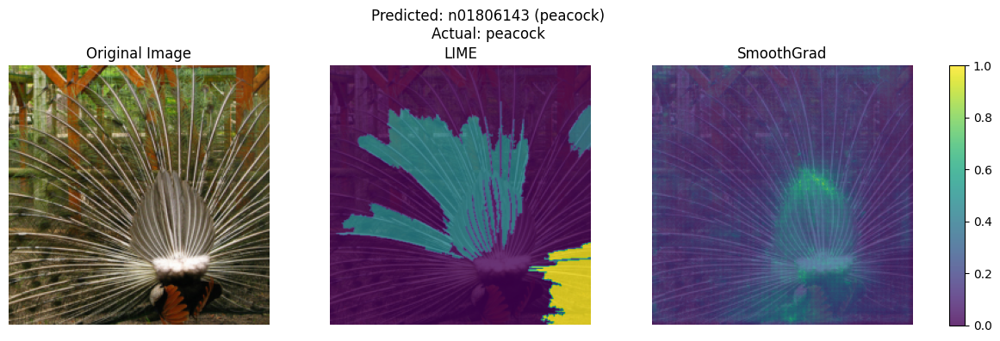

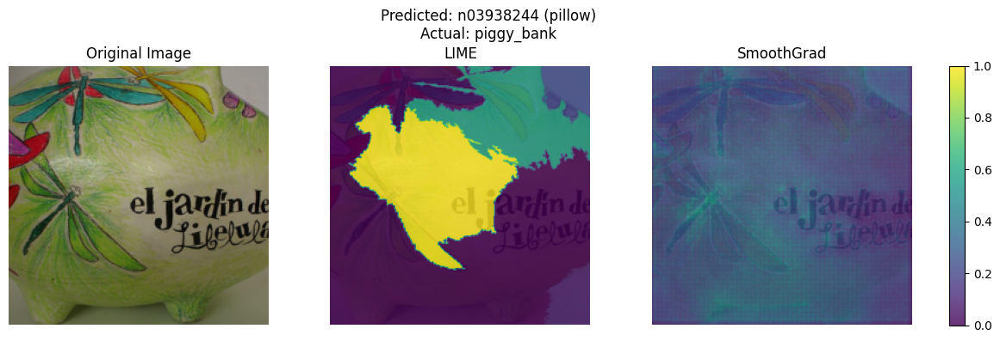

In [10]:
lime_pixels = []
smooth_grad_pixels = []
for img_path in image_paths:
    img = Image.open(img_path).convert('RGB')
    img_proc = preprocess_size(img)
    img_np = np.array(img_proc)
    x_prime, segments = get_interpretable_image(image=img, compactness=25)
    importance_mask = lime(img, x_prime, segments, sim_kernel=image_similarity_kernel, explain_len=15, model=model, num_sampels=400)
    importance_img = Image.fromarray((importance_mask * 255).astype(np.uint8))
    importance_img = preprocess_size(importance_img)
    importance_mask = np.array(importance_img)/255
    predicted_idx, predicted_synset, predicted_label = inference(model, img)
    img_grad = smooth_grad(img, noise_level=0.5, num_samples=200)
    channel_axis = 0 if img_grad.shape[0] == 3 else 2
    img_grad = np.mean(img_grad, axis=channel_axis)
    visualize_explanations(img_np, [importance_mask, img_grad], ['LIME', 'SmoothGrad'], suptitle=f"Predicted: {predicted_synset} ({predicted_label})\nActual: {img_path.split('/')[-1].split('.')[0].strip()}")
    lime_pixels.append(importance_mask)
    smooth_grad_pixels.append(img_grad)

lime_pixels = np.array(lime_pixels)
smooth_grad_pixels = np.array(smooth_grad_pixels)

In [11]:
for i in range(len(lime_pixels)):
    l_explain = lime_pixels[i]
    s_explain = smooth_grad_pixels[i]
    spearman_corr, _ = stats.spearmanr(l_explain.flatten(), s_explain.flatten())
    kendall_tau, _ = stats.kendalltau(l_explain.flatten(), s_explain.flatten())
    
    print(f"Image {i+1}:")
    print(f"Spearman correlation: {spearman_corr}")
    print(f"Kendall tau: {kendall_tau}")

Image 1:
Spearman correlation: 0.28439368314741315
Kendall tau: 0.22327051180064514
Image 2:
Spearman correlation: -0.28568614612470294
Kendall tau: -0.2117998164386489
Image 3:
Spearman correlation: 0.040823491666984145
Kendall tau: 0.028493768870303197
Image 4:
Spearman correlation: 0.04450474537986402
Kendall tau: 0.03621541083702294
Image 5:
Spearman correlation: 0.10590459407149157
Kendall tau: 0.09078164170653238


# Explainations Attacks

In [12]:
def pgd_attack_smoothgrad(model, image, eps, steps, step_size, explanation_weight=1.0, prediction_weight=1.0):
    image_tensor = preprocess(image)
    original_input = image_tensor.clone().unsqueeze(0).to('cuda')
    original_pred_idx, _, _ = inference(model, original_input.squeeze(0))
    
    original_grad = smooth_grad(image, noise_level=0.5, num_samples=100)
    perturbed = image_tensor.clone().detach().to('cuda')
    perturbed.requires_grad = True
    
    for step in range(steps):
        if perturbed.grad is not None:
            perturbed.grad.data.zero_()
        perturbed_input = perturbed.unsqueeze(0)
        output = model(perturbed_input)
        
        current_grad = smooth_grad(transforms.ToPILImage()(perturbed.cpu()), noise_level=0.5, num_samples=100)
        
        explanation_loss = -torch.mean((torch.tensor(current_grad).cuda() - 
                                      torch.tensor(original_grad).cuda())**2)
        
        pred_loss = torch.nn.functional.cross_entropy(output, 
                                                    torch.tensor([original_pred_idx]).cuda())
        total_loss = explanation_weight * explanation_loss + prediction_weight * pred_loss
        total_loss.backward()
        with torch.no_grad():
            grad_sign = perturbed.grad.sign()
            perturbed.data = perturbed.data - step_size * grad_sign
            delta = perturbed.data - image_tensor.cuda()
            delta = torch.clamp(delta, -eps, eps)
            perturbed.data = image_tensor.cuda() + delta
            perturbed.data = torch.clamp(perturbed.data, 0, 1)
    final_perturbed_grad = smooth_grad(transforms.ToPILImage()(perturbed.cpu()), 
                                     noise_level=0.5, num_samples=100)
    
    return perturbed.cpu(), original_grad, final_perturbed_grad



def attack_and_visualize(image_path, eps_values=[2/255, 4/255, 8/255], steps=5):
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(preprocess_size(img))
    
    pred_idx, pred_synset, pred_label = inference(model, img)
    original_grad = smooth_grad(img, noise_level=0.5, num_samples=100)
    original_grad_mean = np.mean(original_grad, axis=0)
    all_images = [img_np]
    explanations = [original_grad_mean]
    titles = ['Original']
    for eps in eps_values:
        perturbed_tensor, _, perturbed_grad = pgd_attack_smoothgrad(
            model, img, eps, steps, eps/steps * 2.5,
            explanation_weight=1.0, prediction_weight=10.0
        )
        perturbed_img = transforms.ToPILImage()(perturbed_tensor)
        perturbed_np = np.array(preprocess_size(perturbed_img))
        pert_idx, pert_synset, pert_label = inference(model, perturbed_tensor)
        all_images.append(perturbed_np)
        explanations.append(np.mean(perturbed_grad, axis=0))
        titles.append(f'ε={eps:.3f}\nPred: {pert_label}')
    explanations = [(exp - exp.min()) / (exp.max() - exp.min()) for exp in explanations]
    
    # Visualize results
    visualize_explanations(
        img_np,
        explanations,
        titles,
        suptitle=f"Original Prediction: {pred_synset} ({pred_label})",
    )
    #plot all images
    plt.figure(figsize=(5*len(all_images), 5))
    for i, img in enumerate(all_images):
        plt.subplot(1, len(all_images), i+1)
        plt.imshow(img)
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

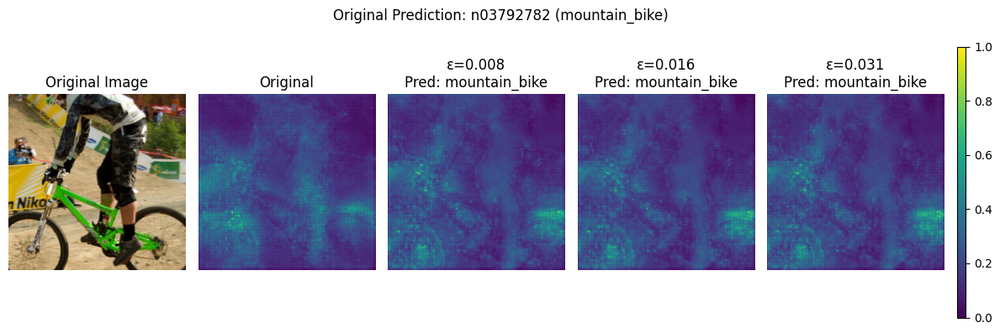

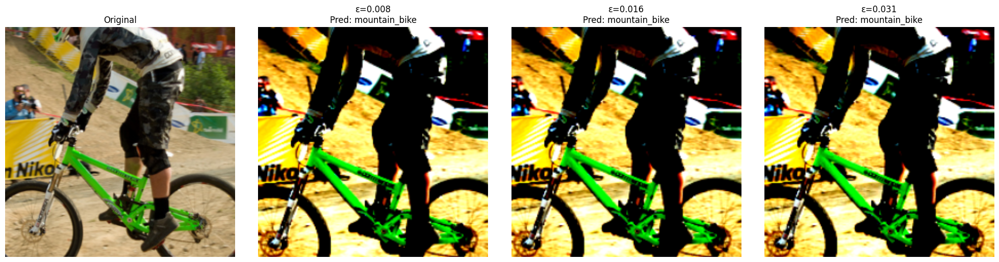

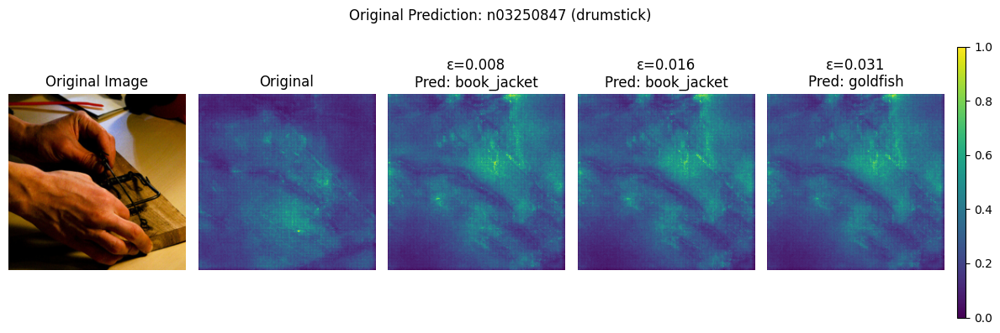

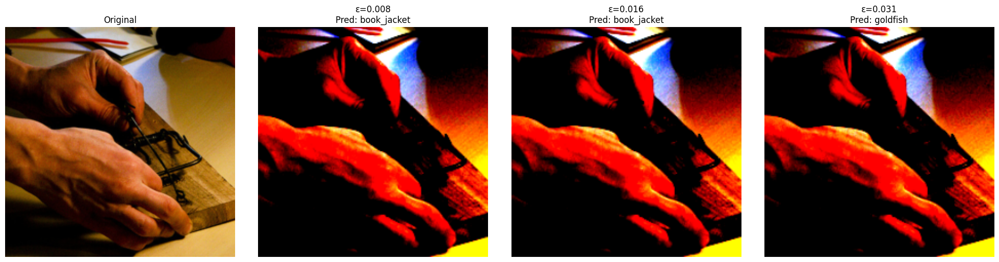

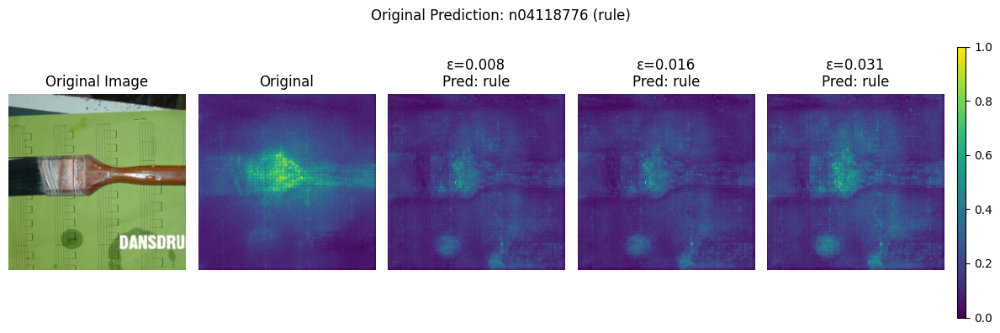

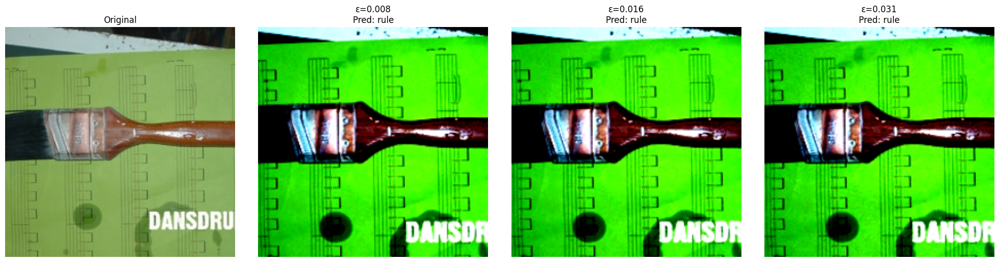

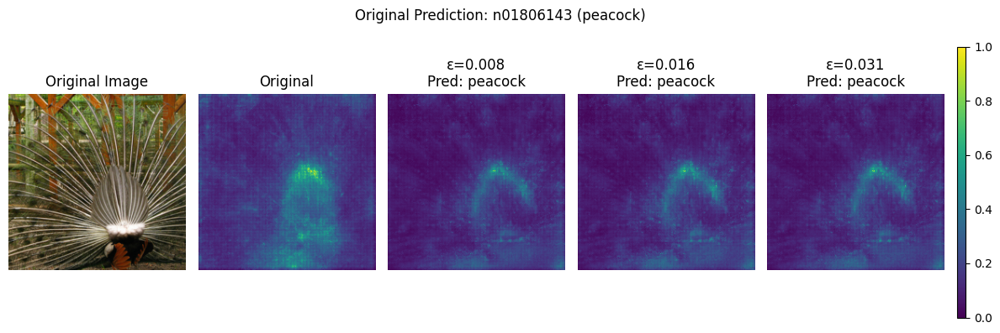

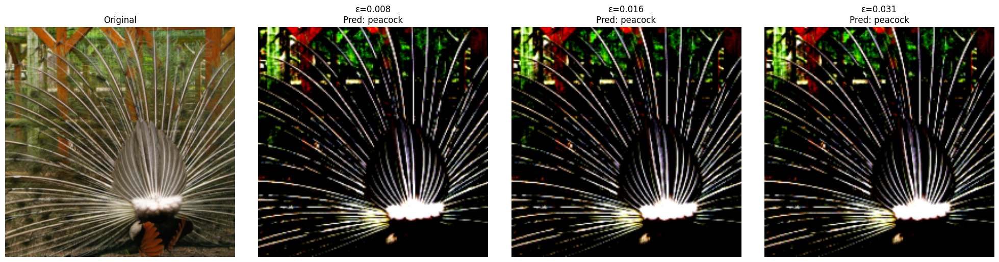

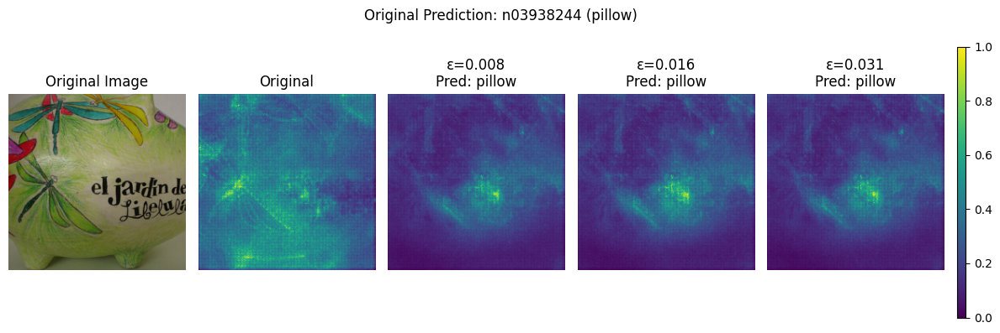

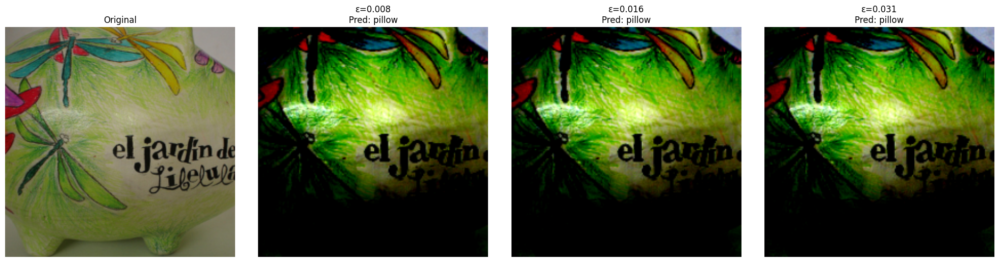

In [13]:
for image_path in image_paths:
    attack_and_visualize(image_path=image_path)